In [2]:
import random
import pandas as pd
import numpy as np
import os
from tqdm import tqdm
import xgboost as xgb
import matplotlib.pyplot as plt
from sktime.forecasting.model_selection import temporal_train_test_split

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(0) # Seed 고정

def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

def mae(y, pred):
    return np.mean(abs(y-pred))
 #점수 측정을 위한 코드  
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

def validate(valid_x, valid_y, model):
    pred = model.predict(valid_x)
    smape_score, mae_score = SMAPE(valid_y, pred), mae(valid_y, pred)
    return smape_score, mae_score


#모델 복잡도를 알아보기 위한 함수
def get_model_complexity(model):
    trees = model.get_booster().get_dump()
    depths = [tree.count('\n') for tree in trees]  # 각 트리의 깊이 계산
    avg_depth = sum(depths) / len(depths)
    return avg_depth


전체 칼럼

['temperature', 'rainfall', 'windspeed', 'humidity', 'power_consumption',
       'hour', 'day', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'outlier', 'sensory', 'THI_cat']

In [4]:
i=1
train_df = pd.read_csv(f'./submit/train_building{i}.csv')
train_df.columns

Index(['temperature', 'rainfall', 'windspeed', 'humidity', 'power_consumption',
       'hour', 'day', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'outlier', 'sensory', 'THI_cat'],
      dtype='object')

기본 칼럼만 사용

In [7]:
drop_col = ['hour', 'day', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI',       'THI_cat']
train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
train_df.columns

Index(['temperature', 'rainfall', 'windspeed', 'humidity', 'power_consumption',
       'outlier', 'sensory'],
      dtype='object')

Index(['temperature', 'power_consumption', 'hour', 'day', 'outlier'], dtype='object')
n_estimator: 100
SMAPE: 7.801347373769672
MAE: 157.49041786389756
깊이의 크기: 87.56


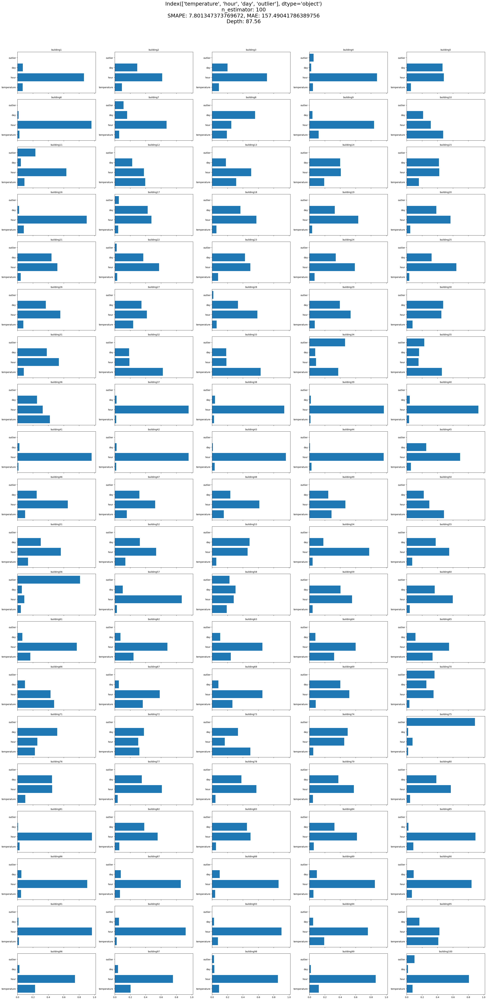

In [11]:
smape_scores = []
mae_scores = []
drop_col = [ 'rainfall', 'windspeed', 'humidity','month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'sensory', 'THI_cat']
i = 1
train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
print(train_df.columns)

fig, ax = plt.subplots(20, 5, figsize=(30, 60), sharex=True)
ax = ax.flatten()

for i in range(1,101,1):
    train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
    pretest_df = pd.read_csv(f'./pretest/pretest_building{i}.csv').drop(columns=drop_col)
    x_train = train_df.drop(columns=['power_consumption'])
    y_train = train_df['power_consumption']
    y_valid = pretest_df['power_consumption']
    x_valid = pretest_df.drop(columns=['power_consumption'])
    
    #print(f"building_{i}")
    model = xgb.XGBRegressor(seed=0,tree_method="hist",gpu_id=0,n_estimators =100)
    model.fit(x_train, y_train)
    
    
    complexity = get_model_complexity(model)
    smape_score, mae_score = validate(x_valid, y_valid, model)
    smape_scores.append(smape_score)
    mae_scores.append(mae_score)
    ax[i-1].set_title(f'building{i}',fontsize = 10)
    ax[i-1].barh(x_train.columns, model.feature_importances_)
smape_mean = np.mean(smape_scores)
mae_mean = np.mean(mae_scores)

print(f"n_estimator: 100")
print(f'SMAPE: {smape_mean}\nMAE: {mae_mean}')
print(f"깊이의 크기: {complexity}")

fig.suptitle(f"{x_train.columns}\nn_estimator: 100\nSMAPE: {smape_mean}, MAE: {mae_mean}\nDepth: {complexity}",fontsize=23, y=1.02)
plt.tight_layout()
plt.show()


In [17]:
train_df = pd.read_csv(f'./pretest/train_building{i}.csv')
train_df.columns

Index(['temperature', 'rainfall', 'windspeed', 'humidity', 'power_consumption',
       'hour', 'day', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'outlier', 'day_hour_mean', 'day_hour_std',
       'hour_mean', 'hour_std', 'max_power', 'min_power', 'THI_cat', 'sensory',
       'Rain_cat'],
      dtype='object')

In [57]:
ss = [8, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 58, 59, 60, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84]

In [95]:
i = 39
a = pd.read_csv(f'./pretest/train_building{i}.csv')

n_estimator: 100
==========Cluster8==========


AttributeError: module 'pandas' has no attribute 'Dataframe'

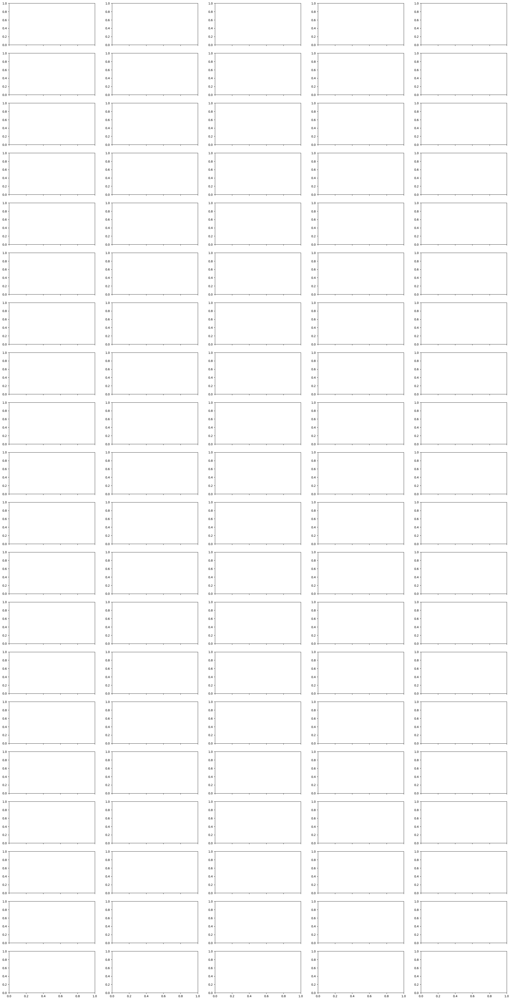

In [3]:
from sklearn.linear_model import LinearRegression
smape_scores = []
mae_scores = []
complexitys=[]
drop_col_origin = []
suptitle = ''


i = 1
train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col_origin)
clusters = [
[32, 61, 62, 63, 64, 65, 66, 67, 68],
[8, 24, 25, 26, 27, 28, 29, 30, 31, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 58, 59, 60, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84],
[1, 2, 4, 5, 6, 7, 9, 11, 12, 16, 33, 34, 35, 36, 54, 57, 81,  96, 97, 98, 99, 100],
[ 13, 15],
[37, 38, 39, 40, 41, 42, 43, 44],
[ 85, 86, 87, 88, 89, 90, 91, 92],
[17, 18, 19, 20, 21, 22, 23],
[93, 94],
[3, 10,14,95]
]


drop_cols = [
    [ 'week', 'THI', 'CDH', 'max_power', 'min_power','day_hour_mean','day_hour_std', 'hour_mean', 'hour_std','outlier','sensory','Rain_cat','close'],
    
    [ 'week', 'THI', 'CDH', 'max_power', 'min_power' ,'day_hour_mean','day_hour_std','hour_mean', 'hour_std','sensory','Rain_cat','close'],
    
    [ 'week', 'THI', 'CDH', 'max_power', 'min_power' ,'close'],
    
    [ 'week','month','holiday', 'THI', 'CDH', 'day_hour_mean', 'day_hour_std',
       'hour_mean', 'hour_std', 'max_power', 'min_power', 'THI_cat', 'sensory','Rain_cat','close'],
    
    [ 'temperature','THI', 'CDH', 'Rain_cat', 'sensory'],
    
    ['hour','max_power', 'min_power' ,'day_hour_mean','day_hour_std','hour_mean', 'hour_std','close'],
    
    [ 'windspeed', 'week', 'CDH', 'sin_time', 'cos_time', 'THI', 'sensory', 'THI_cat','day_hour_mean', 'day_hour_std', 'hour_mean', 'hour_std', 'max_power', 'min_power','Rain_cat','close'],
    
    [ 'week', 'CDH', 'THI', 'sensory', 'THI_cat','close'],
    
    [ 'windspeed', 'week', 'CDH', 'sin_time', 'cos_time', 'THI', 'sensory', 'THI_cat','day_hour_mean', 'day_hour_std', 'hour_mean', 'hour_std', 'max_power', 'min_power','Rain_cat','close']
    ]

fig, ax = plt.subplots(20, 5, figsize=(30, 60), sharex=True)
ax = ax.flatten()
print(f"n_estimator: 100")
for k in range(8,9):
    cluster_smape =[]
    cluster_mae =[]
    cluster_complexitys =[]
    c= [ 'red','green','blue','black','orange','m','gray','lightblue','lightgray']
    print(f'==========Cluster{k}==========')
    for i in clusters[k]:
        
        train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns= drop_cols[k])
        pretest_df = pd.read_csv(f'./pretest/pretest_building{i}.csv').drop(columns= drop_cols[k])
        
        merge = pd.Dataframe
        x_train = train_df.drop(columns=['power_consumption'])
        y_train = train_df['power_consumption']
        y_valid = pretest_df['power_consumption']
        x_valid = pretest_df.drop(columns=['power_consumption'])
        
        
       
        # x_train = x_train.drop(columns=['week'])
        # x_valid = x_valid.drop(columns=['week'])
        #print(f"building_{i}")
        model = xgb.XGBRegressor(seed=0,tree_method="hist",gpu_id=0,n_estimators =100)
        model.fit(x_train, y_train)
        
        linear = LinearRegression()
        linear.fit(x_train, y_train)
        linear_smape,liner_mae = validate(x_valid, y_valid, linear)
        
        print(linear_smape, liner_mae)
        complexity = get_model_complexity(model)        
        smape_score, mae_score = validate(x_valid, y_valid, model)
        cluster_smape.append(smape_score)
        cluster_mae.append(mae_score)
        cluster_complexitys.append(complexity)
        smape_scores.append(smape_score)
        mae_scores.append(mae_score)
        complexitys.append(complexity)
        print(f'building{i}',smape_score,end='\t')
        ax[i-1].set_title(f'building{i}',fontsize = 10)
        ax[i-1].barh(x_train.columns, model.feature_importances_,color=c[k])
    c_sma = np.mean(cluster_smape)
    c_mae = np.mean(cluster_mae)
    c_com = np.mean(cluster_complexitys)
    suptitle = suptitle + f'\nCluster{k}: SMAPE: {c_sma} | MAE: {c_mae} | Depth: {c_com}'    
    print("\n-------------------------")
    print(f"SMAPE: {c_sma} | MAE: {c_mae} | Depth: {c_com}")
    print(x_train.columns)
    print("")
    
smape_mean = np.mean(smape_scores)
mae_mean = np.mean(mae_scores)
complexity_mean = np.mean(complexitys)



print(f'\nALL: SMAPE: {smape_mean} | MAE: {mae_mean} | 깊이의 크기: {complexity_mean}')


fig.suptitle(f"n_estimator: 100\nSMAPE: {smape_mean} | MAE: {mae_mean} | Depth: {complexity_mean}"+suptitle, fontsize=23, y=1.02)
plt.tight_layout()
plt.show()

In [15]:
for n_estimator in [100]:
    smape_scores = []
    mae_scores = []
    drop_col = ['holiday', 'CDH', 'sin_time','cos_time', 'THI', 'day_hour_mean', 'day_hour_std', 'THI_cat']
    for i in range(1,101,1):
        train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
        pretest_df = pd.read_csv(f'./pretest/pretest_building{i}.csv').drop(columns=drop_col)
        x_train = train_df.drop(columns=['power_consumption'])
        y_train = train_df['power_consumption']
        y_valid = pretest_df['power_consumption']
        x_valid = pretest_df.drop(columns=['power_consumption'])
        
        #print(f"building_{i}")
        model = xgb.XGBRegressor(seed=0,tree_method="hist",  gpu_id=0)
        model.fit(x_train, y_train)
        smape_score, mae_score = validate(x_valid, y_valid, model)
        smape_scores.append(smape_score)
        mae_scores.append(mae_score)
    smape_mean = np.mean(smape_scores)
    mae_mean = np.mean(mae_scores)
        
    print(f"n_estimator: {n_estimator}")
    print(f'SMAPE: {smape_mean}\nMAE: {mae_mean}')
    print()

n_estimator: 100
SMAPE: 7.212209406996305
MAE: 143.62088848658198


100%|██████████| 100/100 [00:50<00:00,  1.99it/s]


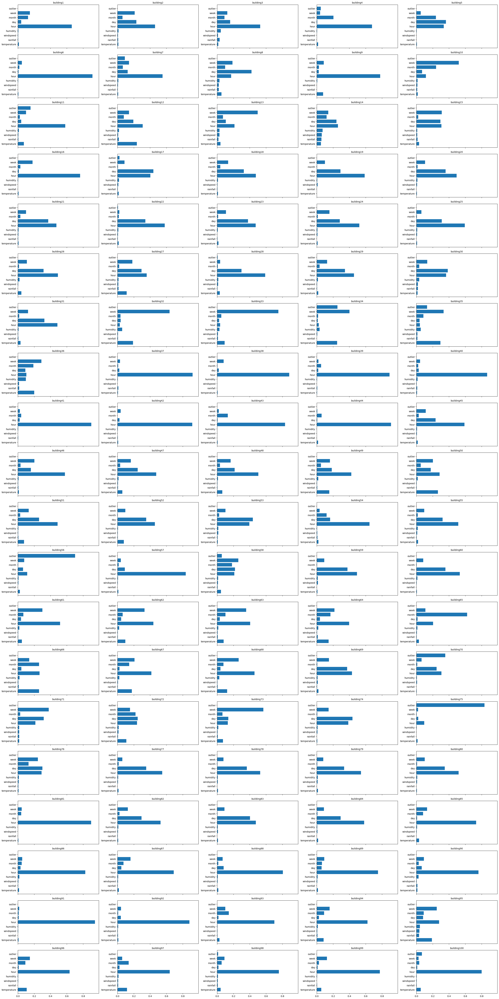

In [8]:
preds = np.array([])
fig, ax = plt.subplots(20, 5, figsize=(30, 60), sharex=True)
ax = ax.flatten()
drop_col = ['holiday', 'CDH', 'sin_time','cos_time', 'THI', 'day_hour_mean', 'day_hour_std', 'THI_cat']
for i in tqdm(range(1,101,1)):
    feature_importances = []
    train_df = pd.read_csv(f'./submit/train_building{i}.csv').drop(columns=drop_col)
    test_df = pd.read_csv(f'./submit/test_building{i}.csv').drop(columns=drop_col)
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
    
    t_x = train_df.drop(columns=['power_consumption'])
    t_y = train_df['power_consumption']
 
    #print(f"building_{i}")
    for seed in [0,1,2,3,4,5,6]:
        
        model = xgb.XGBRegressor(seed=0,tree_method="hist",  gpu_id=0,
                                 n_estimators = 100)
        model.fit(t_x, t_y)
        y_pred = model.predict(test_df)
        feature_importances.append(model.feature_importances_)
        pred_df.loc[:,seed] = y_pred  
    pred = pred_df.mean(axis=1)
    preds = np.append(preds, pred)
    average_feature_importances = np.mean(feature_importances, axis=0)
    ax[i-1].set_title(f'building{i}',fontsize = 10)
    ax[i-1].barh(t_x.columns, average_feature_importances)
    
    

plt.tight_layout()
plt.show()
    


In [10]:
########################################
csv_name = './submission/XGBoost_wsw_simple.csv'
########################################
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv(f'{csv_name}', index = False)

In [12]:
fig, ax = plt.subplots(50,2,figsize=(40, 160), sharex=True)
ax = ax.flatten() 
xticks = np.arange(0, 169, 24) 
xtick_labels = ['0', '24', '48', '72', '96', '120', '144', '168']
for i in range(1,101,1):
    # 그래프 제목 추가
    ax[i-1].set_title(f"building_{i}")
    #day_hour_mean생성
    train_df = pd.read_csv(f'./submit/train_building{i}.csv')
        # 새로운 행 순서를 지정한 리스트 생성
    train_df = train_df.groupby(['day', 'hour'])['power_consumption'].mean().reset_index().pivot(index='day', columns='hour', values='power_consumption')
    # iloc를 사용하여 행 순서 변경
    new_order = [3,4,5,6,0,1,2]
    train_df = train_df.iloc[new_order]
    day_hour_mean = train_df.values.flatten()
    #데이-아워-민
    ax[i-1].plot(np.arange(168),day_hour_mean,label = 'day_hour_mean',color='red')	
    xgboost_simple = pd.read_csv('./submission/XGBoost_wsw_simple.csv')
    xgboost_simple = xgboost_simple.loc[xgboost_simple.index[168*(i-1):168*(i)], 'answer']
    ax[i-1].plot(np.arange(168),xgboost_simple,label = 'xgboost_simple')
    
    #x축, 범례 설정
    ax[i-1].set_xticks(xticks)
    ax[i-1].set_xticklabels(xtick_labels)
    ax[i-1].legend()
plt.tight_layout()
plt.show()